In [57]:
# load the image
from PIL import Image
import numpy as np
import os

dir = 'src/images/'
assert os.path.exists(dir)
files = os.listdir(dir)
if len(files) == 0:
    print('No images found in directory')
    sys.exit(1)
if len(files) > 1:
    print('Multiple images found in directory')
    sys.exit(1)

filename = dir + files[0]

image = Image.open(filename)


/home/miki/prg/satelite_imgs/.conda/lib/python3.11/site-packages/PIL/Image.py:3406: DecompressionBombWarning: Image size (103013456 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


In [16]:
MIN_SIZE = 512
TILE_SIZE = MIN_SIZE * 2

# What will be thrown away
trash = image.size[0] % TILE_SIZE, image.size[1] % TILE_SIZE
total_area = image.size[0] * image.size[1]
thrown_away_area = trash[0] * image.size[1] + trash[1] * image.size[0] - trash[0] * trash[1]
print(f"This ratio will be thrown away: {100*thrown_away_area / total_area:.2f}%")
print(f"There will be {image.size[0] // TILE_SIZE}x{image.size[1] // TILE_SIZE} tiles")

This ratio will be thrown away: 7.37%
There will be 13x7 tiles


In [50]:
tiles = {}

for i in range(0, image.size[0], TILE_SIZE):
    for j in range(0, image.size[1], TILE_SIZE):
        tile = image.crop((i, j, i + TILE_SIZE, j + TILE_SIZE))
        tiles[j//TILE_SIZE,i//TILE_SIZE] = tile

In [51]:
print(len(tiles))
tiles.keys()

112


dict_keys([(0, 0), (1, 0), (2, 0), (3, 0), (4, 0), (5, 0), (6, 0), (7, 0), (0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (0, 2), (1, 2), (2, 2), (3, 2), (4, 2), (5, 2), (6, 2), (7, 2), (0, 3), (1, 3), (2, 3), (3, 3), (4, 3), (5, 3), (6, 3), (7, 3), (0, 4), (1, 4), (2, 4), (3, 4), (4, 4), (5, 4), (6, 4), (7, 4), (0, 5), (1, 5), (2, 5), (3, 5), (4, 5), (5, 5), (6, 5), (7, 5), (0, 6), (1, 6), (2, 6), (3, 6), (4, 6), (5, 6), (6, 6), (7, 6), (0, 7), (1, 7), (2, 7), (3, 7), (4, 7), (5, 7), (6, 7), (7, 7), (0, 8), (1, 8), (2, 8), (3, 8), (4, 8), (5, 8), (6, 8), (7, 8), (0, 9), (1, 9), (2, 9), (3, 9), (4, 9), (5, 9), (6, 9), (7, 9), (0, 10), (1, 10), (2, 10), (3, 10), (4, 10), (5, 10), (6, 10), (7, 10), (0, 11), (1, 11), (2, 11), (3, 11), (4, 11), (5, 11), (6, 11), (7, 11), (0, 12), (1, 12), (2, 12), (3, 12), (4, 12), (5, 12), (6, 12), (7, 12), (0, 13), (1, 13), (2, 13), (3, 13), (4, 13), (5, 13), (6, 13), (7, 13)])

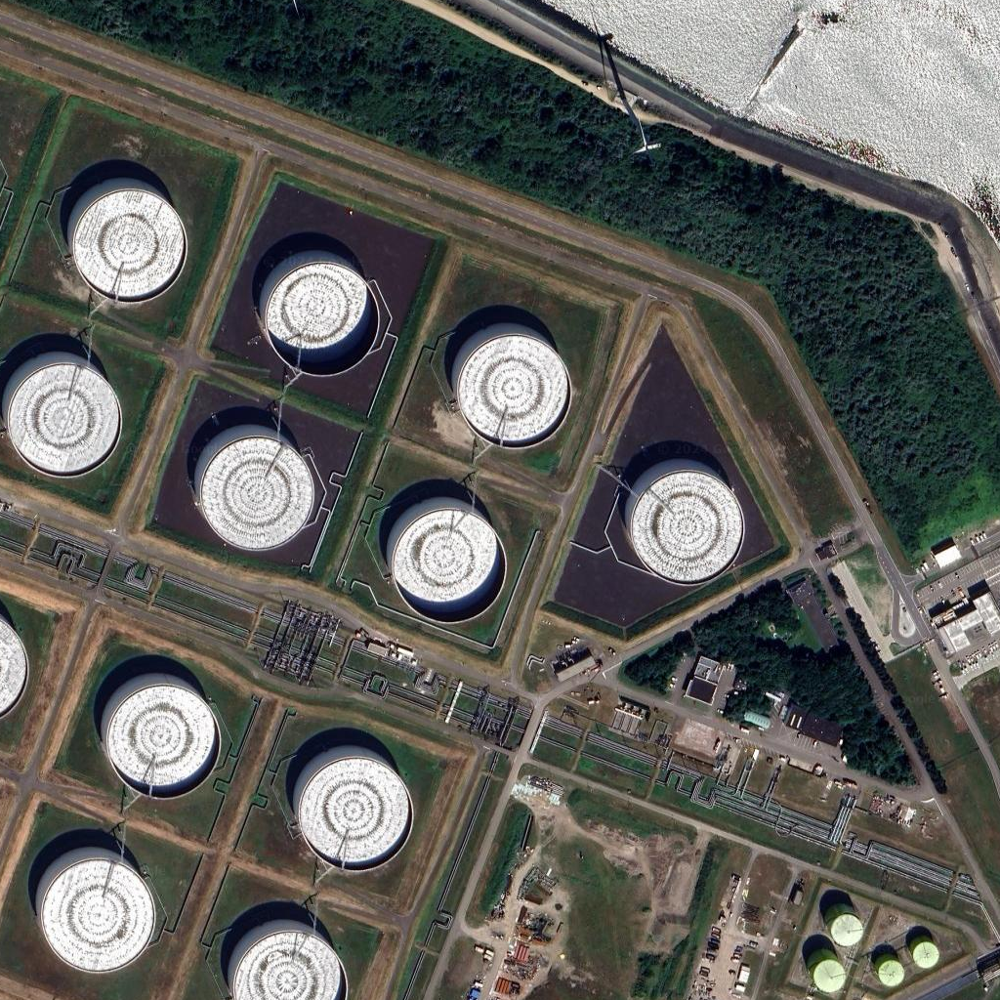

In [56]:
tiles[1, 5]

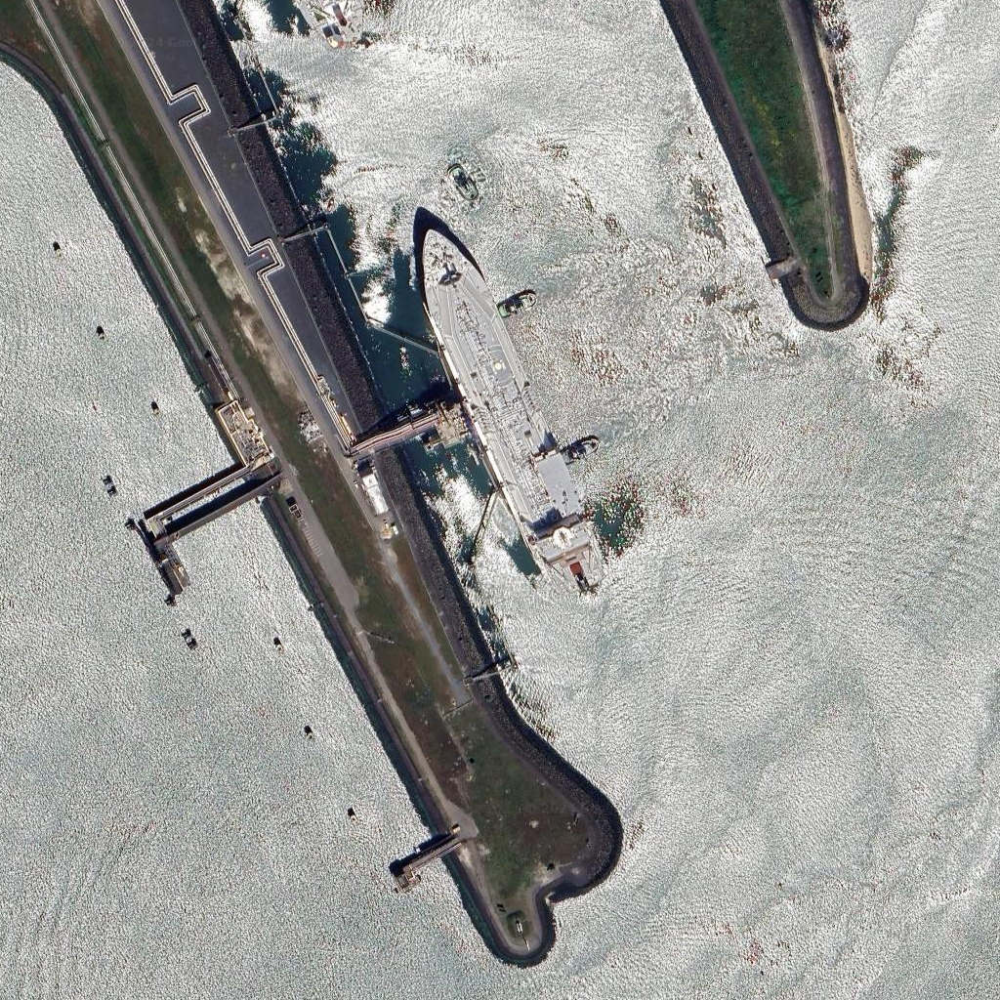

In [58]:
tiles[2, 6]

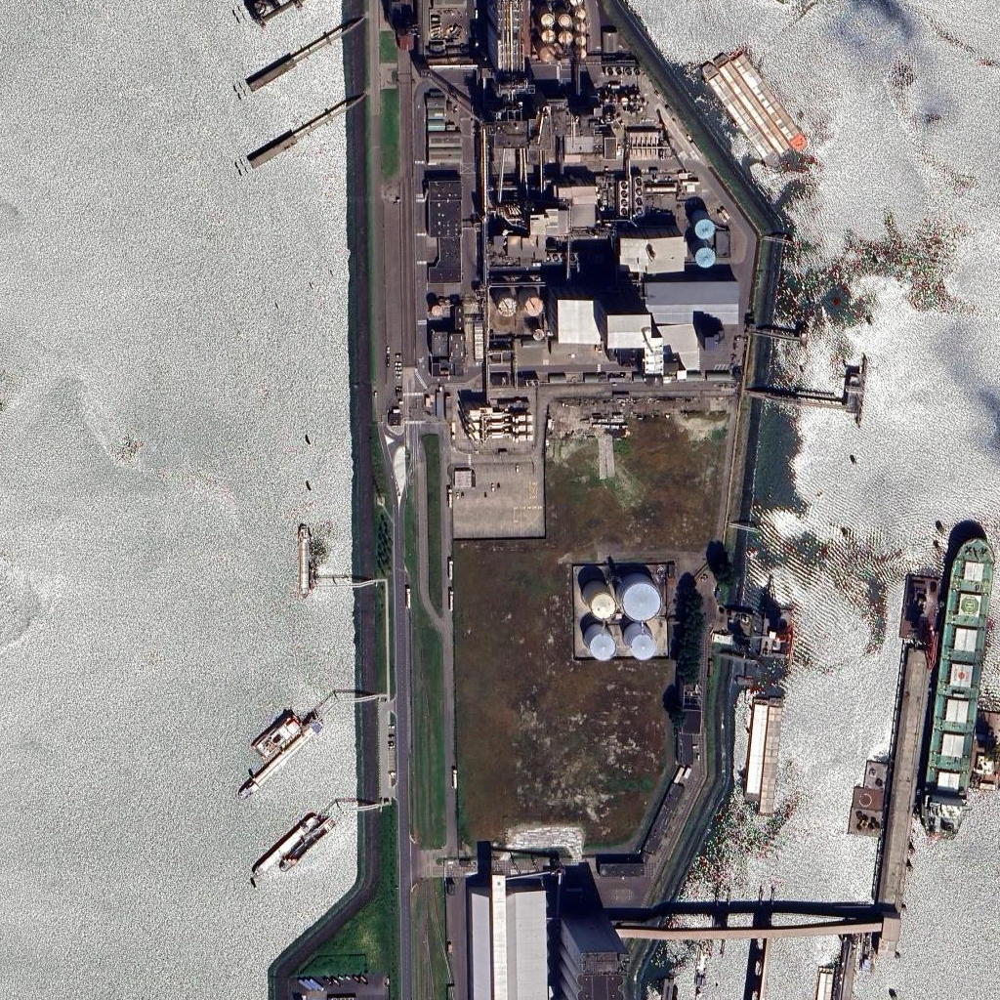

In [62]:
tiles[4, 10]

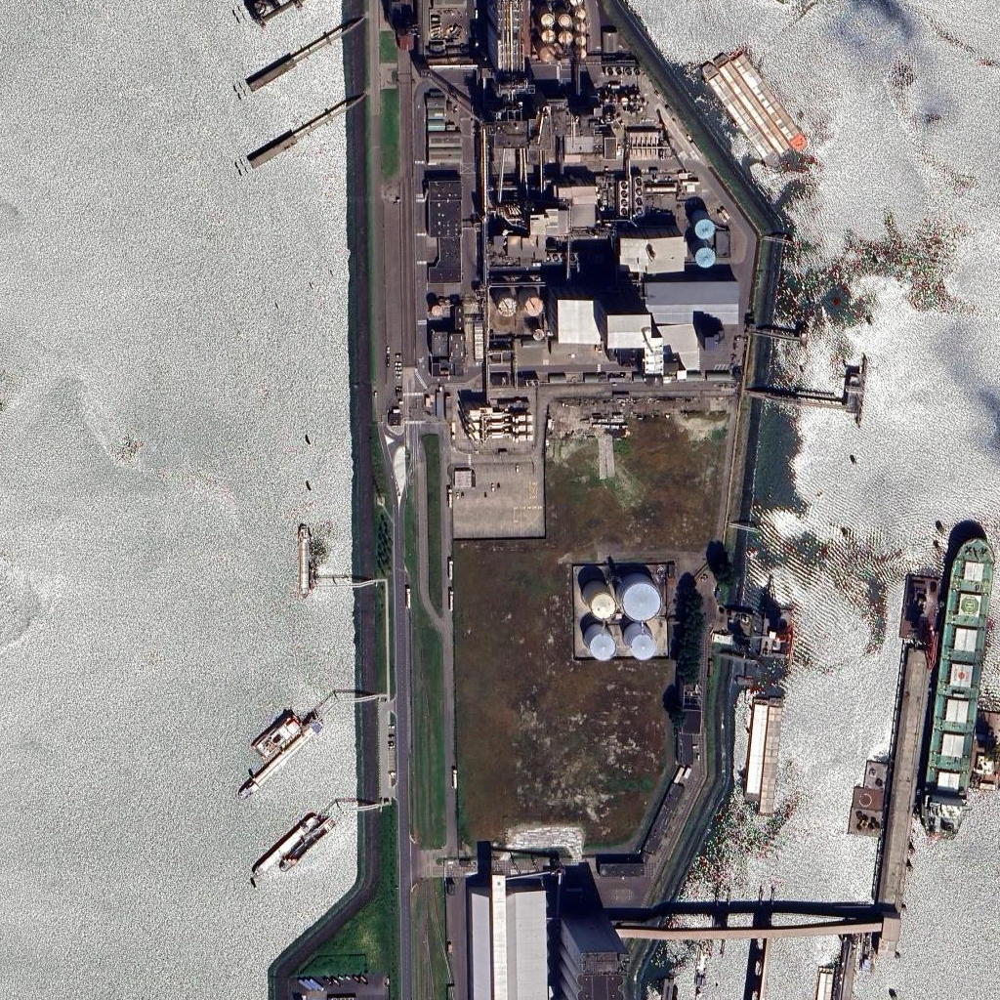

In [63]:
tiles[4, 10]

In [81]:
%load_ext autoreload
%autoreload 2

from location import Location
import os

port_location = Location(name='Tweede Maasvlakte, Netherlands', tiles=tiles, examples=[(1, 5), (2, 6), (4, 10)], meters_per_pixel=0.5)

port_location.save()





The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


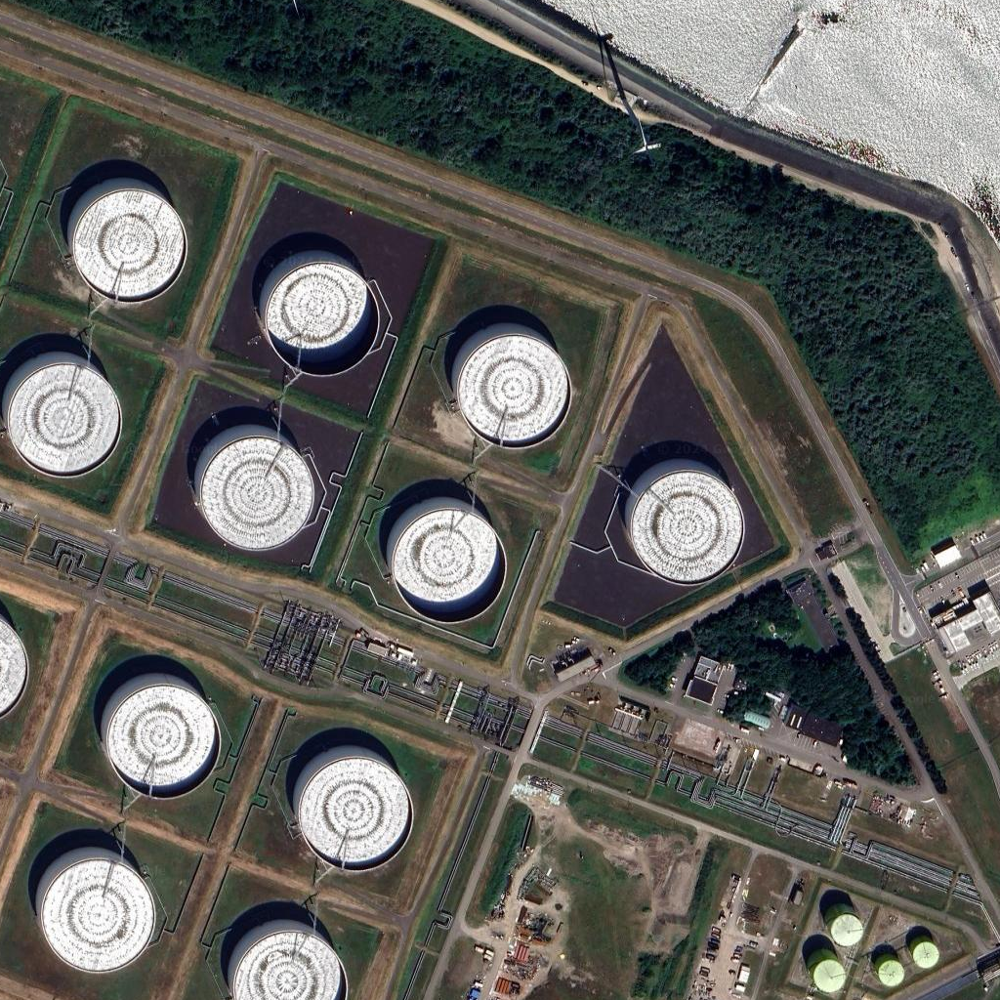

In [85]:
port_location2 = Location(name='Tweede Maasvlakte, Netherlands', tiles=None, examples=[(1, 5), (2, 6), (4, 10)], meters_per_pixel=0.5)
port_location2.load()
port_location2.tiles[port_location2.examples[0]]